C:\Users\11094\AppData\Local\Temp/ipykernel_18912/1237335059.py:41: RuntimeWarning: invalid value encountered in divide
  probabilities = Pxx /np.sum(Pxx, axis=0, keepdims=True)


6.757111
[6.757111, 1.7927228, 7.991285800933838, 5.883721232414246, -1.24062353689649, 0.2422223959251677]
5.931087
[5.931087, 2.2980297, 8.17014455795288, 3.9046894311904907, -0.24663812861367435, -1.4652247760304813]
5.655867
[5.655867, 2.268814, 7.978054046630859, 3.6925123929977417, 0.055626960061117024, -1.3771344265204444]
4.399941
[4.399941, 0.89366555, 4.723801374435425, 3.848280191421509, 1.2942819584592038, 2.1485834750075616]
4.4525456
[4.4525456, 0.9038192, 4.795901775360107, 3.875404477119446, 1.3610226442844897, 2.5239155105696787]
4.057441
[4.057441, 0.92727536, 4.292685031890869, 3.488004446029663, 1.7747199028848877, 3.6462796026913384]


C:\Users\11094\AppData\Local\Temp/ipykernel_18912/1237335059.py:70: UserWarning: 
The palette list has fewer values (1) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(


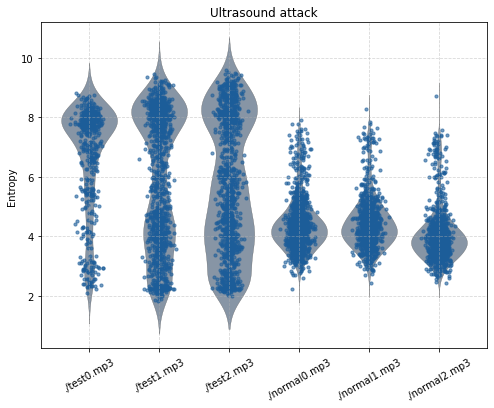

In [6]:
import librosa
import numpy as np
from scipy.signal import welch
import seaborn as sns
from scipy.stats import entropy
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
# def extract_features(entropy_list):
#     features = {
#         'mean': np.mean(entropy_list),          # 均值：反映整体熵水平
#         'std': np.std(entropy_list),            # 标准差：熵波动幅度
#         'q75': np.quantile(entropy_list, 0.75), # 上四分位数：高熵分布
#         'q25': np.quantile(entropy_list, 0.25), # 下四分位数：低熵分布
#         'skew': skew(entropy_list),             # 偏度：分布不对称性
#         'kurtosis': kurtosis(entropy_list)      # 峰度：分布尖锐程度
#     }
#     return features

def extract_entropy_features(entropy_list):
    
    return [np.mean(entropy_list),np.std(entropy_list),np.quantile(entropy_list, 0.75),np.quantile(entropy_list, 0.25),skew(entropy_list),kurtosis(entropy_list)]

def calculate_normalized_power_spectral_entropy(y, sr, window_size=512, hop_length=375):
    entropy_values = []

    # 滑动窗口计算功率谱熵
    for i in range(0, len(y) - window_size + 1, hop_length):
        start = i
        end = i + window_size
      
        windowed_signal = y[start:end]

        
        D = librosa.stft(windowed_signal, n_fft=window_size, window='blackman', hop_length=hop_length)

        # print(D.shape)
        # raise BaseException
        Pxx = np.abs(D) ** 2
        
    
        probabilities = Pxx /np.sum(Pxx, axis=0, keepdims=True)

 
        probabilities[probabilities <= 0] = np.finfo(float).eps
        power_spectral_entropy = np.sum(entropy(probabilities))

        entropy_values.append(power_spectral_entropy)
    
    return entropy_values

test_file = [f'./test{i}.mp3' for i in range(3)]
normal_file = [f'./normal{i}.mp3' for i in range(3)]
audio_paths = test_file +normal_file 
# print(audio_paths)

groups = []
for audio_file in audio_paths:
    y, sr = librosa.load(audio_file, sr=None)  
    normalized_entropy_values = calculate_normalized_power_spectral_entropy(y, sr)
    groups.append(normalized_entropy_values)


clean_data_groups = [[x for x in group if not np.isnan(x)] for group in groups]

for item in clean_data_groups:
    print(np.mean(item))
    print(extract_entropy_features(item))
plt.figure(figsize=(8, 6))

sns.violinplot(
    data=clean_data_groups,
    inner=None,  
    linewidth=0.3,
    palette=["#4A90E2"],  
    
    saturation=0.2
)




for i, group in enumerate(clean_data_groups):
    x = np.random.normal(i, 0.08, size=len(group))
    plt.scatter(
        x, group,
        color='#1C5D99', s=10, alpha=0.6
    )


plt.xticks(ticks=np.arange(len(audio_paths)), labels=audio_paths, rotation=30)


plt.title('Ultrasound attack')
plt.ylabel('Entropy')
plt.grid(True, linestyle='--', alpha=0.5)
plt.savefig("./violin.jpg")
plt.show()


In [5]:
import numpy as np
import librosa
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def extract_spectral_entropy(audio, sr, patch_size=5, stride=2):
    # 参数设置
    n_fft = 512
    hop_length = 137  # 512 - 375 = 137
    window = 'blackman'

    # 1. 计算STFT
    S = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length, window=window)
    S = np.abs(S)  # 取幅度谱

    # 2. 计算E_p的尺寸
    rows, cols = S.shape
    rows_ep = (rows - patch_size) // stride + 1
    cols_ep = (cols - patch_size) // stride + 1
    E_p = np.zeros((rows_ep, cols_ep))

    # 3. 局部聚合与熵计算（带步长）
    for i, x in enumerate(range(0, rows - patch_size + 1, stride)):
        for j, y in enumerate(range(0, cols - patch_size + 1, stride)):
            # 提取补丁
            patch = S[x:x+patch_size, y:y+patch_size]
            # 计算功率谱并归一化
            power = np.square(patch)
            power = power / (np.sum(power) + 1e-10)  # 避免除零
            # 计算功率谱熵
            entropy = -np.sum(power * np.log(power + 1e-10))  # 避免log(0)
            E_p[i, j] = entropy

    return E_p

# 文件路径
test_files = [f'./test{i}.mp3' for i in range(3)]  # 受攻击音频
normal_files = [f'./normal{i}.mp3' for i in range(3)]  # 正常音频
audio_paths = test_files + normal_files

# 提取所有音频的频谱混乱图并展平
entropy_data = []
labels = []

for i, audio_file in enumerate(audio_paths):
    audio, sr = librosa.load(audio_file, sr=None)  # 加载音频
    entropy_map = extract_spectral_entropy(audio, sr, patch_size=5,stride=4)  # 你可以调整patch_size
    print(f"音频 {i+1} 频谱混乱图形状:", entropy_map.shape)
    
    # 展平 entropy_map 并记录
    entropy_flat = entropy_map.flatten()
    entropy_data.extend(entropy_flat)
    
    # 记录标签：0表示正常，1表示受攻击
    if audio_file in test_files:
        labels.extend([1] * len(entropy_flat))  # 受攻击音频
    else:
        labels.extend([0] * len(entropy_flat))  # 正常音频

# 将数据转换为 numpy 数组
entropy_data = np.array(entropy_data).reshape(-1, 1)  #les, 1) 的形状
labels = np.array(labels)

# 应用 t-SNE 降维
tsne = TSNE(n_components=2, random_state=42)
entropy_tsne = tsne.fit_transform(entropy_data)

# 绘制 t-SNE 散点图
plt.figure(figsize=(10, 8))
scatter = plt.scatter(entropy_tsne[:, 0], entropy_tsne[:, 1], c=labels, cmap='coolwarm', s=10)
plt.colorbar(scatter, label='0: Normal, 1: Attack')
plt.title('t-SNE Visualization of Spectral Entropy for All Audios')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

音频 1 频谱混乱图形状: (64, 372)


Note: Illegal Audio-MPEG-Header 0x2c353236 at offset 383040.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


音频 2 频谱混乱图形状: (64, 838)


Note: Illegal Audio-MPEG-Header 0x372c3131 at offset 348480.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


音频 3 频谱混乱图形状: (64, 763)


Note: Illegal Audio-MPEG-Header 0x2c373433 at offset 353280.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


音频 4 频谱混乱图形状: (64, 773)


Note: Illegal Audio-MPEG-Header 0x2c333030 at offset 269760.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


音频 5 频谱混乱图形状: (64, 590)


Note: Illegal Audio-MPEG-Header 0x37352c36 at offset 288960.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


音频 6 频谱混乱图形状: (64, 632)


ValueError: n_components=2 must be between 1 and min(n_samples, n_features)=1 with svd_solver='randomized'

48000
(1025, 399)


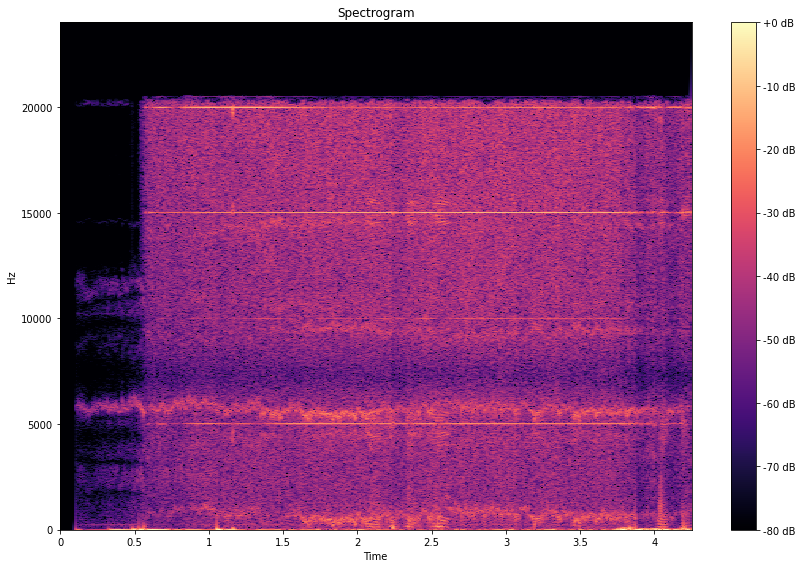

48000
(1025, 898)


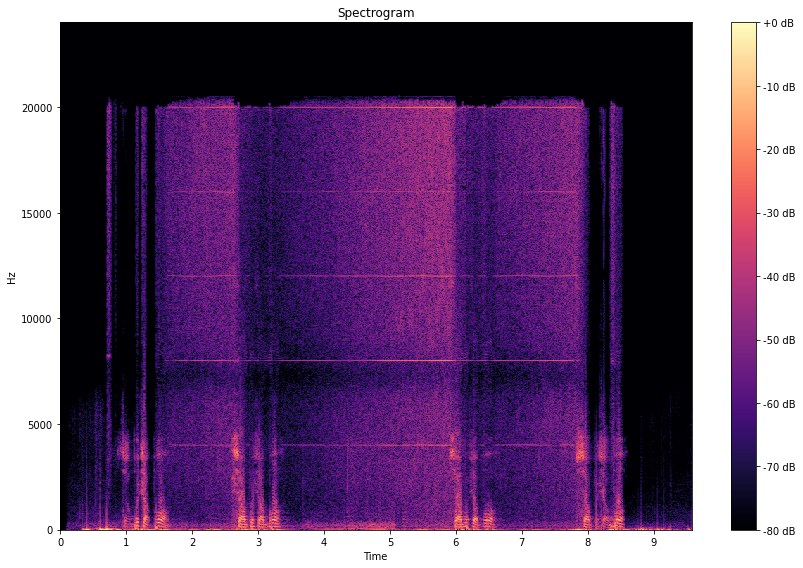

48000
(1025, 817)


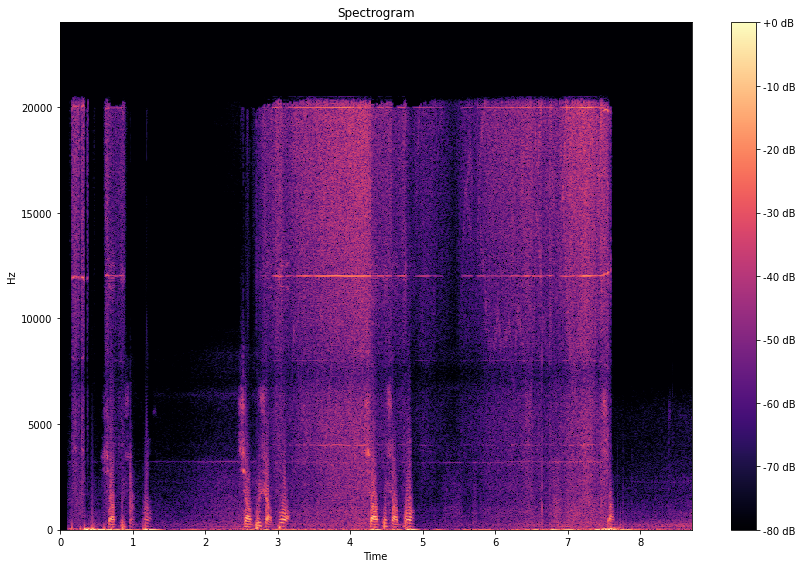

In [9]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

for i in range(3):
    audio_path = f'./test{i}.mp3'  
    y, sr = librosa.load(audio_path, sr=None)  

    D = librosa.stft(y, n_fft=2048, hop_length=512, win_length=2048)
 
    D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    print(sr)
    print(D_db.shape)
    
    plt.figure(figsize=(12, 8))
    librosa.display.specshow(D_db, sr=sr, x_axis='time', y_axis='linear', fmax=30)
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
 

    plt.tight_layout()
    plt.show()

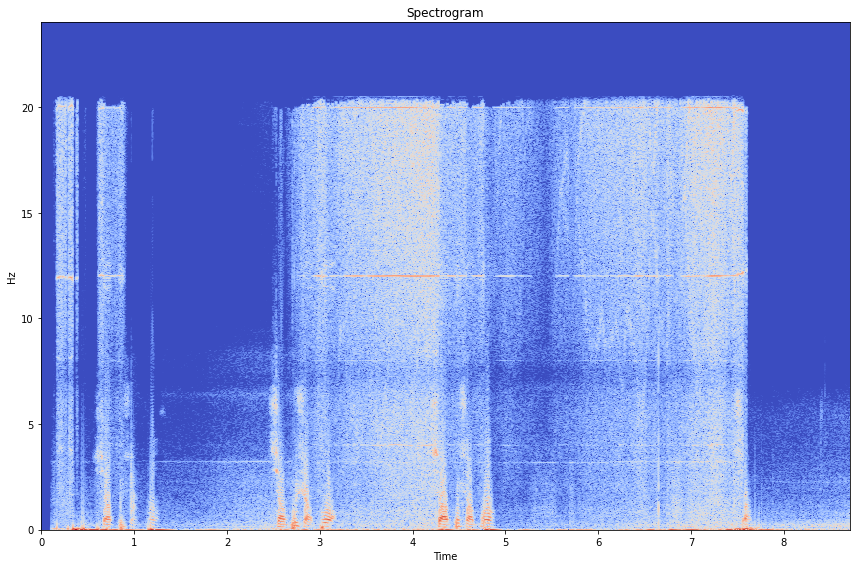

In [ ]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt


audio_path = './test2.mp3' 
y, sr = librosa.load(audio_path, sr=None)  
D = librosa.stft(y, n_fft=2048, hop_length=512, win_length=2048)
D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(12, 8))
librosa.display.specshow(D_db, sr=sr, x_axis='time', y_axis='linear', fmax=30e3,
                       cmap='coolwarm')  
plt.yticks([i*1000 for i in [0,5,10,15,20]], ["0", "5", "10", "15", "20"])



plt.title('Spectrogram')
plt.tight_layout()
plt.show()

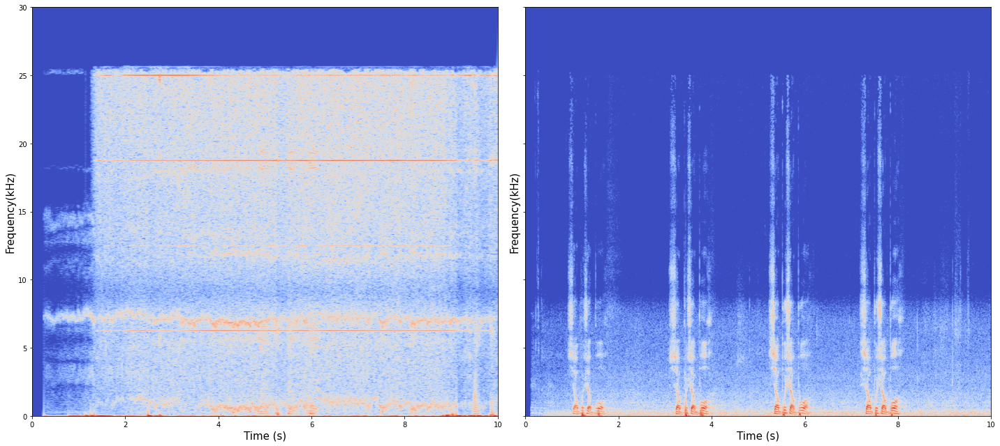

In [3]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

audio_files = ['./test0.mp3', './normal0.mp3']

fig, axs = plt.subplots(nrows=1, ncols=len(audio_files), figsize=(20, 9), sharey=True)


for i, audio_path in enumerate(audio_files):

    y, sr = librosa.load(audio_path, sr=None) 


    D = librosa.stft(y, n_fft=2048, hop_length=512, win_length=2048)

    D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)


    axs[i].imshow(D_db, aspect='auto', origin='lower', cmap='coolwarm', extent=[0, 10, 0, 30e3])
    axs[i].set_xlabel('Time (s)',fontsize=15)  
    axs[i].set_ylabel("Frequency(kHz)",fontsize=15)
    axs[i].set_yticks([i*1000 for i in [0,5,10,15,20,25,30]], ["0", "5", "10", "15", "20","25","30"])  


plt.tight_layout()
plt.savefig('line.svg')
plt.show()

['./test0.mp3', './test1.mp3', './test2.mp3', './normal0.mp3', './normal1.mp3', './normal2.mp3']


C:\Users\11094\AppData\Local\Temp/ipykernel_24428/1788320204.py:24: RuntimeWarning: invalid value encountered in divide
  probabilities = Pxx / np.sum(Pxx, axis=0, keepdims=True)


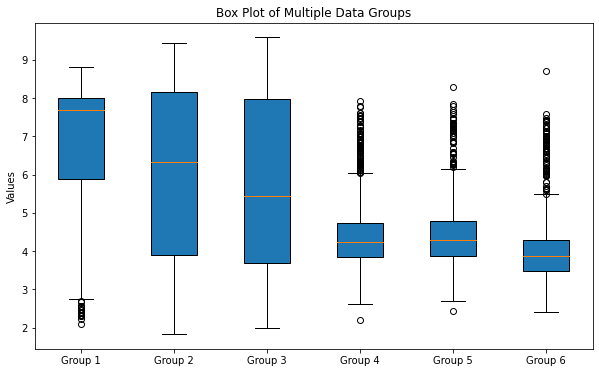

In [ ]:
import librosa
import numpy as np
from scipy.signal import welch
from scipy.stats import entropy
def calculate_normalized_power_spectral_entropy(y, sr, window_size=512, hop_length=375):
    # 初始化熵值列表
    entropy_values = []

    # 滑动窗口计算功率谱熵
    for i in range(0, len(y) - window_size + 1, hop_length):
        start = i
        end = i + window_size
        # 截取当前窗口的数据
        windowed_signal = y[start:end]

        # 执行STFT，使用Blackman窗口
        D = librosa.stft(windowed_signal, n_fft=window_size, window='blackman', hop_length=hop_length)

        # 计算功率谱
        Pxx = np.abs(D) ** 2

        # 归一化功率谱以获得概率分布
        # probabilities = Pxx 
        probabilities = Pxx / np.sum(Pxx, axis=0, keepdims=True)

        # 计算功率谱熵，避免0值
        probabilities[probabilities <= 0] = np.finfo(float).eps
        power_spectral_entropy = np.sum(entropy(probabilities))
        entropy_values.append(power_spectral_entropy)

    return entropy_values

# 加载音频文件
test_file = [f'./test{i}.mp3' for i in range(3)]
normal_file = [f'./normal{i}.mp3' for i in range(3)]
audio_paths = test_file+normal_file  # 替换为你的MP3文件路径
print(audio_paths)

groups = []
for audio_file in audio_paths:
    y, sr = librosa.load(audio_file, sr=None)  # sr=None保持原始采样率
    normalized_entropy_values = calculate_normalized_power_spectral_entropy(y, sr)
    groups.append(normalized_entropy_values)


clean_data_groups = [[x for x in group if not np.isnan(x)] for group in groups]

plt.figure(figsize=(10, 6))
plt.boxplot(clean_data_groups, vert=True, patch_artist=True, labels=[f'Group {i+1}' for i in range(len(clean_data_groups))])
plt.title('Box Plot of Multiple Data Groups')
plt.ylabel('Values')
plt.show()

In [ ]:
import librosa
import numpy as np
from scipy.signal import welch
from scipy.stats import entropy
def calculate_normalized_power_spectral_entropy(y, sr, window_size=512, hop_length=375):
    # 初始化熵值列表
    entropy_values = []

    # 滑动窗口计算功率谱熵
    for i in range(0, len(y) - window_size + 1, hop_length):
        start = i
        end = i + window_size
        windowed_signal = y[start:end]

        D = librosa.stft(windowed_signal, n_fft=window_size, window='blackman', hop_length=hop_length)
        Pxx = np.abs(D) ** 2
        f, Pxx_welch = welch(windowed_signal, fs=sr, window='blackman', nperseg=window_size)
        
    
        probabilities = np.divide(Pxx_welch, Pxx_welch.sum())


        
        probabilities[probabilities <= 0] = np.finfo(float).eps
        power_spectral_entropy = entropy(probabilities)

        entropy_values.append(power_spectral_entropy)

    return entropy_values


test_file = [f'./test{i}.mp3' for i in range(3)]
normal_file = [f'./normal{i}.mp3' for i in range(3)]
audio_paths = test_file+normal_file 

y, sr = librosa.load(audio_path, sr=None) 

groups = []
normalized_entropy_values = calculate_normalized_power_spectral_entropy(y, sr)

print(normalized_entropy_values[:30])

In [1]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from scipy import signal
from scipy.signal import stft
plt.rcParams['font.sans-serif'] = ['SimHei']  # 用来正常显示中文标签
plt.rcParams['axes.unicode_minus'] = False    # 用来正常显示负号
# def fast_carrier_trace_detection(audio, fs, window_size=512, overlap=375, threshold_corr=0.05):
#     """
#     检测音频信号中的载波痕迹。

#     参数:
#     - audio: 一维 NumPy 数组（时间域音频信号）
#     - fs: 采样频率（Hz）
#     - window_size: STFT 窗口大小（默认：512）
#     - overlap: 相邻窗口的重叠大小（默认：375）
#     - threshold_corr: 相关系数阈值（默认：0.85）

#     返回:
#     - 检测结果（True/False）和载波频率（如果检测到）
#     """
#     # Step 1: STFT 变换
#     f, t, S = signal.stft(audio, fs, nperseg=window_size, noverlap=overlap)
#     S_mag = np.abs(S)  # 幅度谱

#     # Step 2: 归一化幅度谱
#     S_min = np.min(S_mag)
#     S_max = np.max(S_mag)
#     S_norm = (S_mag - S_min) / (S_max - S_min)

#     # Step 3: 创建水平模板
#     template_length = S_norm.shape[1]  # 时间帧数
#     # carrier_template = np.ones(template_length)
#     carrier_template = np.ones(template_length) + np.random.normal(0, 0.001, template_length)
#     # Step 4: 计算相关系数
#     corr_coeffs = []
#     for freq_idx in range(S_norm.shape[0]):
#         current_line = S_norm[freq_idx, :]
#         # 计算相关系数
#         # print(carrier_template,current_line)
#         # corr = np.corrcoef(carrier_template, current_line)[0, 1]
#         corr, p_value = spearmanr(carrier_template, current_line)
#         # print(corr)
#         # corr = abs(corr)
#         corr_coeffs.append(corr)
    
#     # Step 5: 找出最大相关系数
#     print(corr_coeffs)
#     max_corr = np.max(corr_coeffs)
#     max_corr_index = np.argmax(corr_coeffs)
#     max_freq = f[max_corr_index]

#     # Step 6: 计算频率线的斜率
#     # 使用线性回归拟合检测到的频率线
#     x = np.arange(len(S_norm[max_corr_index, :]))
#     coeffs = np.polyfit(x, S_norm[max_corr_index, :], 1)
#     slope = coeffs[0]

#     # Step 7: 判断条件
#     print(max_corr,abs(slope))
#     if max_corr > threshold_corr and abs(slope) < 0.1:  # 斜率接近 0
#         return True, max_freq
#     else:
#         return False, None
    
# import numpy as np
# from scipy.signal import stft

# def fast_carrier_trace_detection(audio, fs=48000, threshold=0.02, slope_tolerance=0.05):
#     # STFT计算
#     f, t, Zxx = stft(audio, fs=fs, window='blackman', nperseg=512, noverlap=375)
#     S = np.abs(Zxx)
    
#     # 归一化
#     S_normalized = (S - np.min(S)) / (np.max(S) - np.min(S))
#     print(S_normalized)
#     # 构建模板
#     T = S_normalized.shape
#     carrier_template = np.ones(T)+np.random.normal(0, 0.0001, T)
    
#     # 计算相关系数
#     corr_coeffs = [np.corrcoef(line, carrier_template)[0,1] for line in S_normalized]
#     max_corr = np.max(corr_coeffs)
#     max_index = np.argmax(corr_coeffs)
    
#     # 计算斜率
#     target_line = S_normalized[max_index, :]
#     # print(target_line.shape)
#     # print(T[1])
#     time = np.arange(T[1])
#     slope,_ = np.polyfit(time, target_line, 1)
#     print(slope)
#     print(format(max_corr, '.8f'))
#     # 判断条件
#     if max_corr > threshold and abs(slope) < slope_tolerance:
#         return True, f[max_index]  # 返回检测结果及对应频率
#     else:
#         return False, None

# 示例：合成一个有载波信号的音频
if __name__ == "__main__":
    # 生成一个带有载波的示例音频
    test_file = [f'./test{i}.mp3' for i in range(3)]
    normal_file = [f'./normal{i}.mp3' for i in range(3)]
    audio_paths = test_file+normal_file 

    for audio_path in audio_paths:
        
        y, sr = librosa.load(audio_path, sr=None) 
        detected, freq = fast_carrier_trace_detection(y, fs=sr)
        print(detected)
        print(f"载波检测结果: {detected}, 载波频率: {freq} Hz")

        # 绘图
        plt.figure(figsize=(12, 6))
        D = librosa.stft(y, n_fft=512, hop_length=375, win_length=512)

        D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)


        plt.imshow(D_db, aspect='auto', origin='lower', cmap='coolwarm', extent=[0, 10, 0, 30e3])
        # plt.set_xlabel('Time (s)',fontsize=15)  
        # plt.set_ylabel("Frequency(kHz)",fontsize=15)
        # plt.set_yticks([i*1000 for i in [0,5,10,15,20,25,30]], ["0", "5", "10", "15", "20","25","30"])  

        # plt.pcolormesh(t, f, np.abs(S), shading='auto', cmap='viridis')
        plt.colorbar(label='幅度')
        plt.title('频谱图')
        # plt.xlabel('时间 (s)')
        # plt.ylabel('频率 (Hz)')
        if freq:
            plt.axhline(y=freq, color='r', linestyle='--', label='载波检测')
        plt.legend()
        plt.show()

NameError: name 'fast_carrier_trace_detection' is not defined

[ 2.73050785e-08  9.67415780e-08 -2.96736352e-08  4.80833330e-08
  1.12249468e-08  2.84379136e-08  6.12965685e-08  4.09387646e-08
 -7.57290641e-08 -7.74715087e-08 -3.69146653e-08  1.45701836e-08
 -5.05938832e-08 -1.63919213e-08  1.42340273e-07 -2.06700751e-08
 -1.81707311e-09 -1.09729792e-07 -4.11975682e-08  5.23895445e-08
 -1.60532614e-08 -3.41702125e-08  1.20841887e-07 -1.52560968e-08
  3.56954172e-08  2.69783491e-08 -2.10049652e-08 -1.70953252e-07
  4.99340702e-08 -9.57311823e-08 -3.48544951e-09  2.74341930e-08
  3.62718335e-08  3.89734310e-08  8.87105593e-09  6.01429882e-08
  2.36523909e-08  1.02359737e-07 -2.00029814e-08  5.64001906e-08
 -9.00441999e-09 -2.17158574e-08 -3.27839464e-08 -1.22757893e-08
  3.40023738e-08  1.06991953e-07  6.61361196e-08 -6.61126130e-08
  6.95621222e-08 -8.63464472e-08  9.87169385e-08 -2.20636532e-08
  1.16874391e-08 -3.00630472e-08 -9.48894568e-09 -4.61776532e-08
  7.85145816e-08 -2.06731362e-08 -1.92894043e-08 -2.74687730e-08
 -2.49879188e-08  6.85667

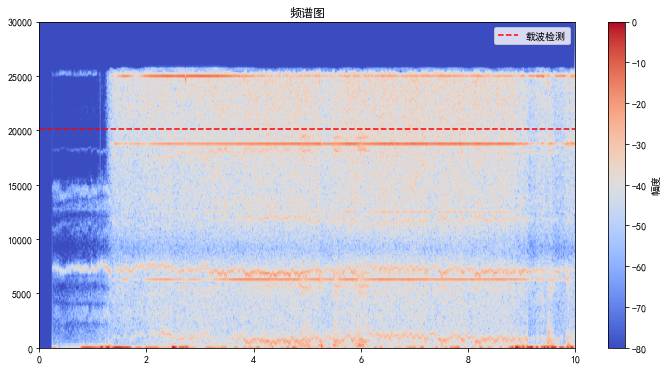

[-4.67899147e-08  5.60468037e-08 -1.07184660e-09  4.34754157e-08
 -2.03569599e-09  3.47372271e-08  2.89716398e-09  2.96566513e-08
 -5.52112011e-09 -4.67618677e-09 -1.32861534e-08 -1.68941727e-08
 -1.17413765e-08 -1.42164729e-10 -2.13463908e-08  4.18515083e-09
  3.95386609e-09 -1.62622698e-08  1.34802522e-08  1.38138481e-08
  2.24786762e-09  3.19191966e-08 -1.54232466e-08 -2.25264393e-08
 -2.02127985e-08  4.69344810e-09  6.36628393e-08  2.25857864e-08
  9.29517392e-08 -4.11004323e-09  3.25112878e-08 -4.31342220e-08
  4.25527280e-08  9.63567093e-09 -1.89627769e-08 -4.27250737e-08
  1.71416920e-08  3.29255002e-08 -1.41207080e-08 -1.53415167e-08
  2.23751755e-09  1.50678834e-08  1.90816738e-08  5.59460115e-08
  2.21184316e-08 -3.65126824e-10  5.39993130e-08 -1.06113687e-08
  4.78041548e-08 -1.56415551e-09  5.82808868e-08  1.07067267e-07
  7.20443954e-08 -7.20591268e-08 -2.59083015e-08  1.65984329e-08
 -6.50149980e-08  6.25719223e-08  8.25498241e-08  1.77964389e-09
 -4.82934845e-08  1.07096

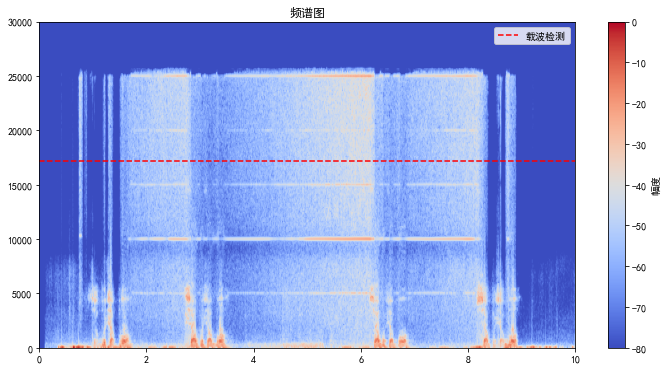

[ 3.20687027e-08  2.09850992e-08 -2.09161366e-08 -1.61576107e-09
 -6.78134976e-08 -3.60594928e-08 -3.63505658e-08  1.44169685e-08
 -5.86057414e-10  6.04198458e-08 -4.27263432e-08 -2.31478793e-09
 -1.76975965e-08  6.12035376e-08 -1.85080933e-09 -3.50165447e-08
 -2.65102291e-08  5.75222696e-09  2.22220431e-08 -1.74518417e-08
 -3.16863293e-08  7.52494890e-08 -2.15580237e-10 -2.54037160e-08
  4.95376086e-09  2.35454121e-08  8.59927539e-08  1.86662408e-08
  4.78940009e-08 -2.41039954e-08  9.75298780e-10  7.39592963e-09
 -4.91266482e-08  9.39561589e-08  2.63357427e-08 -4.38280440e-08
  1.85032066e-08 -3.02400198e-08 -5.10804094e-09  3.39382329e-08
 -1.47353393e-08  1.93510359e-08  2.52543469e-08  2.75535206e-08
 -1.89927430e-09 -3.90059695e-08 -2.87078014e-08  1.46573533e-09
 -4.53600967e-08  3.00214451e-08  3.05444052e-08  3.04394941e-09
  5.68530105e-09  1.92258957e-08  4.96668704e-08  3.40443304e-08
 -5.68488291e-09 -6.01363065e-08 -6.68144715e-09  5.94828348e-08
 -4.97293098e-08  1.04974

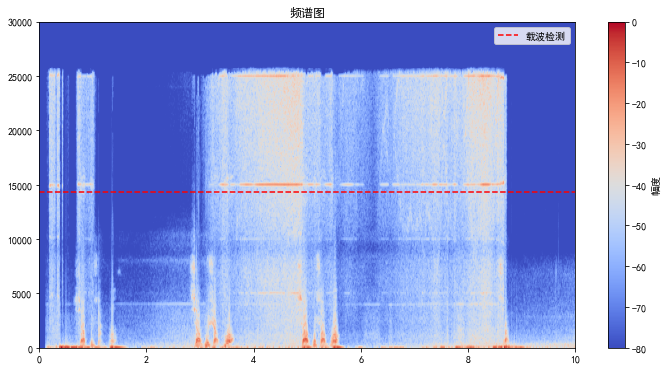

[ 7.39033983e-09  1.19345500e-08 -2.91229371e-08 -5.28059784e-09
 -5.68709629e-09 -1.48542990e-08 -1.88544912e-08  4.07469850e-08
  3.48564746e-08 -1.36959742e-08 -2.19729119e-08 -3.10891480e-08
 -2.61829140e-08  2.38089679e-08 -6.71408398e-09 -8.53708711e-09
 -1.81054842e-08 -1.43357972e-08  1.09338574e-08  3.96904505e-08
  3.09075811e-08  1.62538636e-08  3.24064392e-08  1.24507268e-08
 -3.40234458e-08 -5.43352765e-08  2.11175491e-08  2.23004230e-08
 -1.42943415e-09  1.58431887e-08  4.30618326e-08 -1.63026948e-08
  3.19690418e-08  1.55608077e-07  2.16227604e-10 -2.47000444e-08
  3.19479363e-08 -1.60406031e-08 -4.09512829e-09 -9.79619886e-09
  9.00189271e-09 -2.02548634e-08 -1.33612741e-08  2.30440351e-08
 -4.02427000e-09  4.61576589e-08  5.06450771e-08  2.64201734e-08
 -1.72423154e-08  2.06161111e-08 -5.21443927e-08  4.63613517e-09
 -1.24221594e-09  1.19140382e-08  3.84507950e-08  3.89654276e-08
 -2.85492749e-08  1.63009553e-08 -4.72481645e-08 -1.34496447e-08
 -5.65167458e-09  5.84388

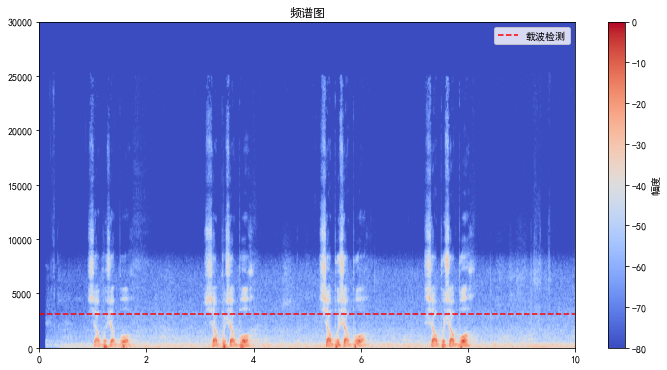

[ 1.38534233e-08  1.08030752e-08 -5.40123328e-09 -5.13801651e-08
 -3.45279087e-08 -4.83358397e-09 -3.76206393e-08  3.85994555e-08
  2.38140172e-08  3.09988379e-08  3.53619084e-08  2.96873766e-08
 -2.06044632e-08  2.28867700e-08 -1.55691331e-08 -3.75113900e-08
 -1.45475397e-08 -1.64560618e-08  1.21468932e-08  3.13141174e-08
  1.34045091e-08  4.07417887e-09  6.57659332e-09  7.80709601e-09
 -5.73698099e-08  2.05946947e-08  6.41359554e-08  3.94307362e-09
  3.64414487e-08  7.82311962e-09 -1.74455581e-08  2.71626115e-08
 -1.74329771e-08  4.36663331e-09 -2.06551750e-08  2.07191613e-08
 -2.51817946e-09 -2.69485747e-08  3.96359047e-08 -5.38058244e-09
  2.66105027e-08  8.24606757e-09  6.08844761e-09 -3.87734268e-09
  4.06648107e-11  1.73158710e-09  2.08311814e-08 -1.63032113e-09
  2.11217344e-08 -1.43238024e-08 -5.01713129e-09  6.05274372e-09
 -8.26390276e-09  1.30297734e-09  1.56208205e-08  1.19277103e-08
  1.23358984e-09  5.17954688e-09  7.09017693e-09 -6.19289692e-09
  1.11560191e-08  1.20944

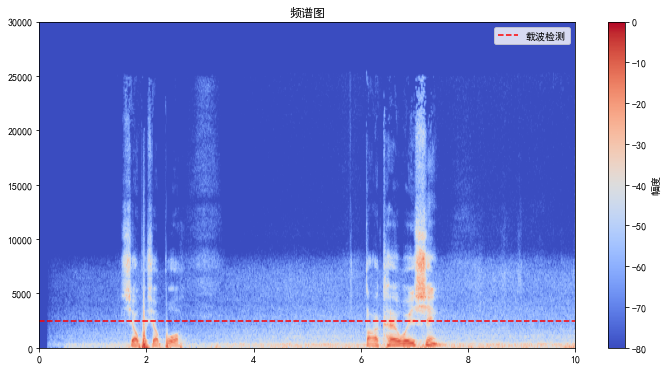

[-2.12676464e-08  1.45522024e-08 -6.69384106e-09  2.13886334e-08
 -2.51319698e-09 -1.55686535e-08  1.00421845e-08  3.57194952e-08
 -1.11417205e-08 -1.79929497e-08  5.43289288e-09  4.71697133e-08
 -1.48316812e-08  4.20923542e-08  2.44106992e-10  3.88624664e-08
  2.46238100e-08  4.46790595e-08 -9.34390342e-09 -9.81892006e-09
  2.08248604e-08 -1.48509463e-08  4.64401031e-08  3.82878817e-09
 -2.70998216e-08 -5.44789282e-08  2.83566673e-08  5.54895235e-08
  3.04226953e-08  6.77603770e-09  2.43325291e-08 -3.40879397e-08
 -9.19874352e-10  1.83293215e-08 -4.08259723e-08  1.54970578e-08
  1.25600019e-08  1.77697974e-08  1.40430313e-08 -8.01354032e-10
  2.12136615e-08 -3.57832863e-08  1.36631649e-08 -1.29577556e-08
  7.99492248e-09 -1.11944484e-08  1.18832164e-08  1.07119151e-08
  1.96298140e-08  9.66674165e-09  1.02622954e-08 -8.38893959e-09
 -1.17796326e-08 -5.55703950e-09  1.72009361e-08  1.09687172e-08
  2.57300874e-08 -1.41297713e-08  5.05103925e-08  9.53800268e-09
 -9.11255139e-09 -6.47047

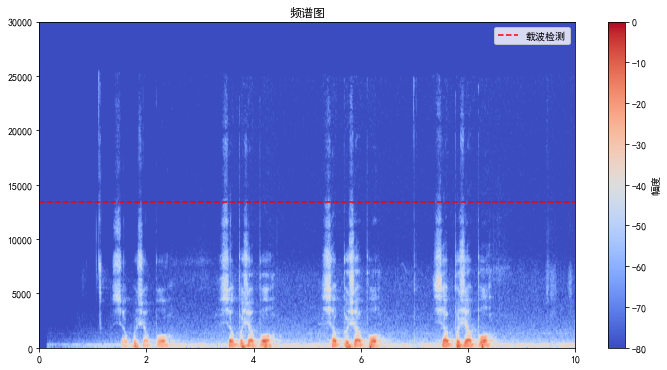

In [4]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from scipy import signal
from scipy.signal import stft
plt.rcParams['font.sans-serif'] = ['SimHei']  # 用来正常显示中文标签
plt.rcParams['axes.unicode_minus'] = False    # 用来正常显示负号


def fast_carrier_trace_detection(audio, sr=48000, n_fft=512, hop_length=128, threshold=0.02,epsilon=1e-3):
    """改进后的载波痕迹检测算法（修正模板使用问题）"""
    # 1. STFT变换
    S = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length, window=signal.windows.blackman(n_fft))
    mag = np.abs(S)
    F, T = mag.shape
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    # 2. 标准化（处理零标准差）
    mag_norm = np.zeros_like(mag)
    for f in range(F):
        x = mag[f, :]
        mu = np.mean(x)
        sigma = np.std(x)
        if sigma < 1e-6:
            mag_norm[f, :] = x
        else:
            mag_norm[f, :] = (x - mu) / sigma
    
    # 3. 余弦相似度计算
    template = np.ones(T)
    numerator = np.sum(mag_norm * template, axis=1)  # 分子
    denominator = np.sqrt(np.sum(mag_norm**2, axis=1)) * np.sqrt(T)  # 分母
    sim = numerator / (denominator + 1e-10)  # 避免除以零
    print(sim)
    # 4. 筛选最大相似度
    max_idx = np.argmax(sim)
    max_sim = sim[max_idx]
    carrier_freq = freqs[max_idx]
    
    # 5. 斜率验证
    time_series = mag[max_idx, :]
    slope,_ = np.polyfit(np.arange(T), time_series, 1)
    
    # if abs(slope) < epsilon and max_sim > threshold:
    print(max_sim)
    return True, carrier_freq
    # else:
    #     return False, 0.0

# 示例：合成一个有载波信号的音频
if __name__ == "__main__":
    # 生成一个带有载波的示例音频
    test_file = [f'./test{i}.mp3' for i in range(3)]
    normal_file = [f'./normal{i}.mp3' for i in range(3)]
    audio_paths = test_file+normal_file 
    # audio_paths = test_file
    for audio_path in audio_paths:
        
        y, sr = librosa.load(audio_path, sr=None) 
        detected, freq = fast_carrier_trace_detection(y,sr)
        print(detected)
        print(f"载波检测结果: {detected}, 载波频率: {freq} Hz")

        # 绘图
        plt.figure(figsize=(12, 6))
        D = librosa.stft(y, n_fft=512, hop_length=128, win_length=512)

        D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)


        plt.imshow(D_db, aspect='auto', origin='lower', cmap='coolwarm', extent=[0, 10, 0, 30e3])
        # plt.set_xlabel('Time (s)',fontsize=15)  
        # plt.set_ylabel("Frequency(kHz)",fontsize=15)
        # plt.set_yticks([i*1000 for i in [0,5,10,15,20,25,30]], ["0", "5", "10", "15", "20","25","30"])  

        # plt.pcolormesh(t, f, np.abs(S), shading='auto', cmap='viridis')
        plt.colorbar(label='幅度')
        plt.title('频谱图')
        # plt.xlabel('时间 (s)')
        # plt.ylabel('频率 (Hz)')
        if freq:
            plt.axhline(y=freq, color='r', linestyle='--', label='载波检测')
        plt.legend()
        plt.show()
        # break

[ 0.01481318  0.00831698 -0.00183176 ... -0.53680757 -0.53241919
 -0.52898328]
0.18779221782574537
True
载波检测结果: True, 载波频率: 2835.9375 Hz


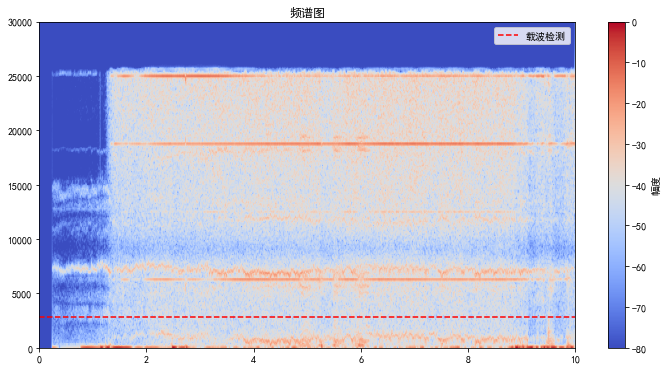

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[ 0.03383088  0.03444646  0.04251084 ... -0.51611199 -0.51386699
 -0.51607254]
0.07366267740560145
False
载波检测结果: False, 载波频率: 0.0 Hz


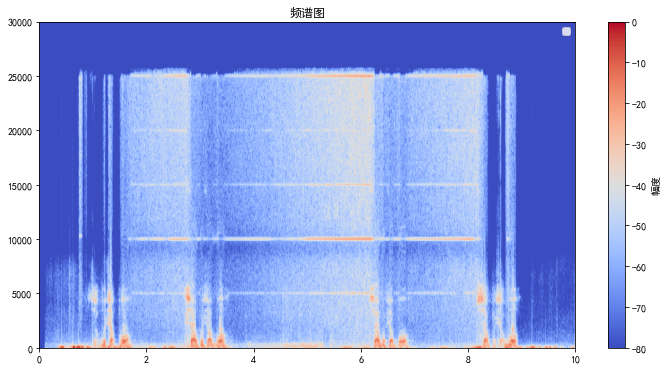

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[ 0.04777189  0.04354789  0.03690527 ... -0.37553112 -0.30814863
 -0.28161748]
0.06834795109364528
False
载波检测结果: False, 载波频率: 0.0 Hz


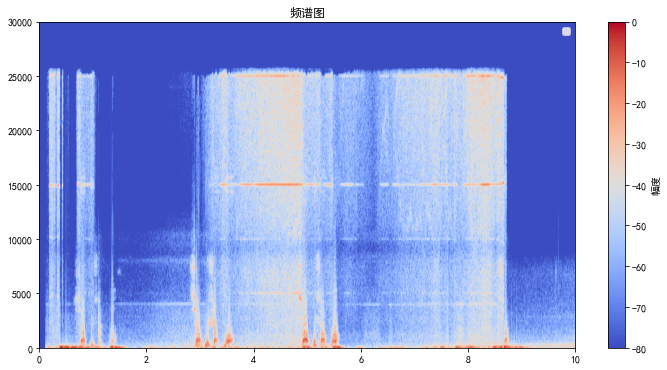

[ 0.03217776  0.03413847  0.03651287 ... -0.50247792 -0.5213024
 -0.53269323]
0.10176272676281269
True
载波检测结果: True, 载波频率: 2976.5625 Hz


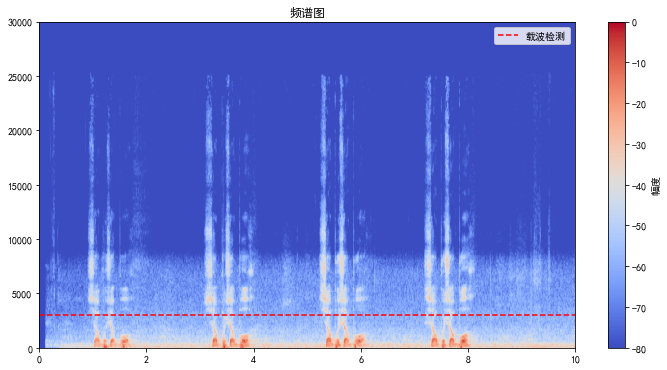

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[-0.00926368 -0.00542245  0.00455982 ... -0.53583403 -0.53746238
 -0.5394174 ]
0.07085716869587963
False
载波检测结果: False, 载波频率: 0.0 Hz


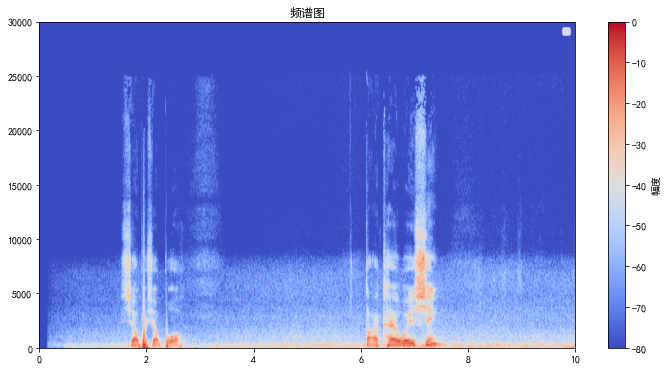

[ 0.03997521  0.0351584   0.03457999 ... -0.02713298 -0.06230449
 -0.15322139]
0.11342334056434117
True
载波检测结果: True, 载波频率: 11671.875 Hz


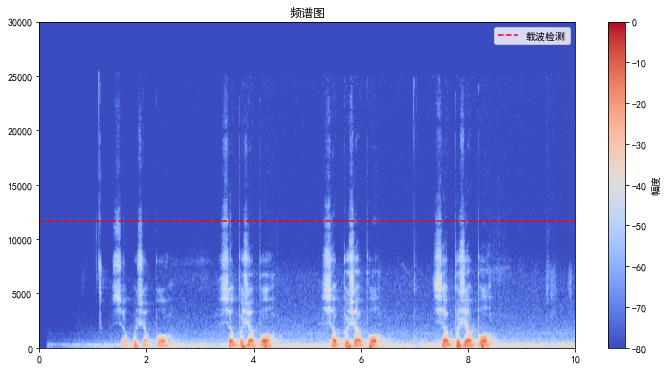

In [5]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from scipy import signal
from scipy.signal import stft
plt.rcParams['font.sans-serif'] = ['SimHei']  # 用来正常显示中文标签
plt.rcParams['axes.unicode_minus'] = False    # 用来正常显示负号


def fast_carrier_trace_detection(audio, sr=48000, n_fft=2048, hop_length=512, 
                               threshold=0.10, epsilon=0.05, var_thresh=0.1):
    """改进后的载波检测算法"""
    # STFT with higher resolution
    S = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length,
                    window=signal.windows.blackman(n_fft))
    mag = np.abs(S)
    F, T = mag.shape
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    # 滑动平均处理
    mag_smoothed = np.apply_along_axis(
        lambda x: np.convolve(x, np.ones(5)/5, mode='same'),
        axis=1,
        arr=mag
    )
    
    # 动态模板生成
    template = np.convolve(np.ones(T), np.ones(5)/5, mode='same')
    
    # 相似度计算
    mag_norm = (mag_smoothed - np.mean(mag_smoothed, axis=1, keepdims=True)) / \
               (np.std(mag_smoothed, axis=1, keepdims=True) + 1e-10)
    template_norm = (template - np.mean(template)) / (np.std(template) + 1e-10)
    
    similarity = mag_norm.dot(template_norm) / (np.linalg.norm(mag_norm, axis=1) * np.linalg.norm(template_norm))
    
    # 多条件检测
    # variances = np.var(mag_smoothed, axis=1)
    max_idx = np.argmax(similarity)
    print(similarity)
    # 斜率验证
    time_series = mag_smoothed[max_idx, :]
    slope = np.polyfit(np.arange(T), time_series, 1)[0]
    
    # 综合判断
    print(similarity[max_idx])
    if (similarity[max_idx] > threshold and 
        abs(slope) < epsilon):
        return True, freqs[max_idx]
    else:
        return False, 0.0

# 示例：合成一个有载波信号的音频
if __name__ == "__main__":
    # 生成一个带有载波的示例音频
    test_file = [f'./test{i}.mp3' for i in range(3)]
    normal_file = [f'./normal{i}.mp3' for i in range(3)]
    audio_paths = test_file+normal_file 
    # audio_paths = test_file
    for audio_path in audio_paths:
        
        y, sr = librosa.load(audio_path, sr=None) 
        detected, freq = fast_carrier_trace_detection(y,sr)
        print(detected)
        print(f"载波检测结果: {detected}, 载波频率: {freq} Hz")

        # 绘图
        plt.figure(figsize=(12, 6))
        D = librosa.stft(y, n_fft=512, hop_length=128, win_length=512)

        D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)


        plt.imshow(D_db, aspect='auto', origin='lower', cmap='coolwarm', extent=[0, 10, 0, 30e3])
        # plt.set_xlabel('Time (s)',fontsize=15)  
        # plt.set_ylabel("Frequency(kHz)",fontsize=15)
        # plt.set_yticks([i*1000 for i in [0,5,10,15,20,25,30]], ["0", "5", "10", "15", "20","25","30"])  

        # plt.pcolormesh(t, f, np.abs(S), shading='auto', cmap='viridis')
        plt.colorbar(label='幅度')
        plt.title('频谱图')
        # plt.xlabel('时间 (s)')
        # plt.ylabel('频率 (Hz)')
        if freq:
            plt.axhline(y=freq, color='r', linestyle='--', label='载波检测')
        plt.legend()
        plt.show()
        # break

[ 0.01481318  0.00831698 -0.00183176 ... -0.53680757 -0.53241919
 -0.52898328]
0.18779221782574537
True
载波检测结果: True, 载波频率: 2835.9375 Hz


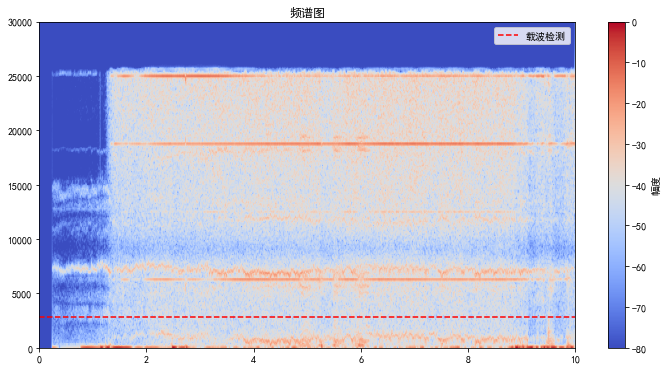

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[ 0.03383088  0.03444646  0.04251084 ... -0.51611199 -0.51386699
 -0.51607254]
0.07366267740560145
False
载波检测结果: False, 载波频率: 0.0 Hz


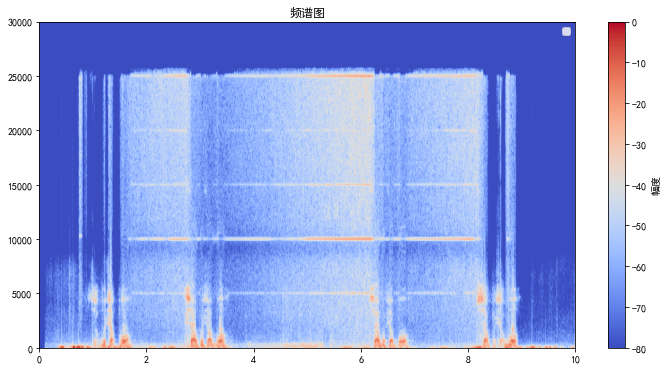

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[ 0.04777189  0.04354789  0.03690527 ... -0.37553112 -0.30814863
 -0.28161748]
0.06834795109364528
False
载波检测结果: False, 载波频率: 0.0 Hz


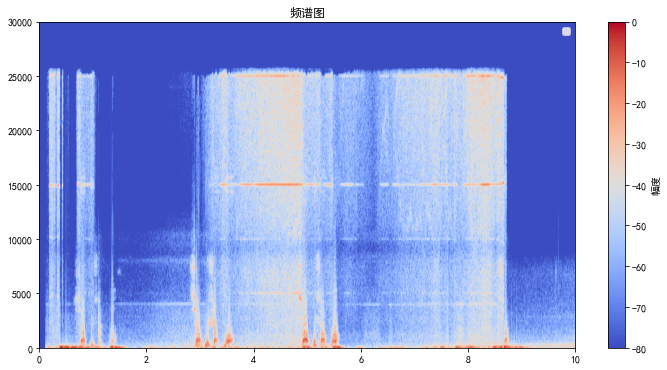

[ 0.03217776  0.03413847  0.03651287 ... -0.50247792 -0.5213024
 -0.53269323]
0.10176272676281269
True
载波检测结果: True, 载波频率: 2976.5625 Hz


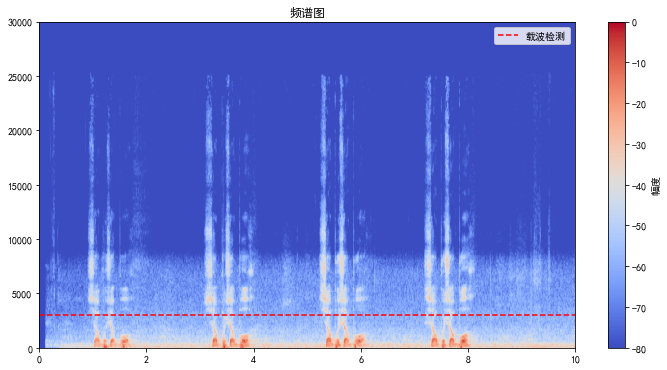

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[-0.00926368 -0.00542245  0.00455982 ... -0.53583403 -0.53746238
 -0.5394174 ]
0.07085716869587963
False
载波检测结果: False, 载波频率: 0.0 Hz


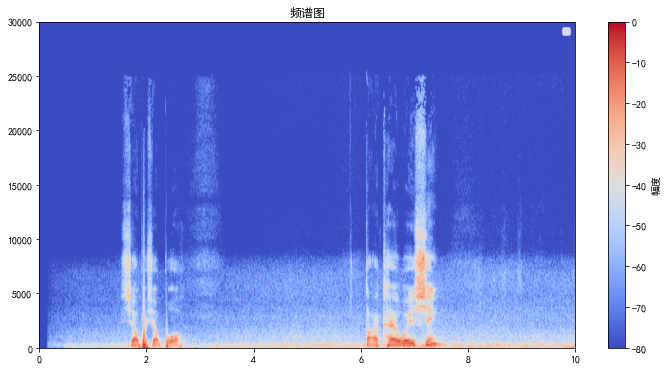

[ 0.03997521  0.0351584   0.03457999 ... -0.02713298 -0.06230449
 -0.15322139]
0.11342334056434117
True
载波检测结果: True, 载波频率: 11671.875 Hz


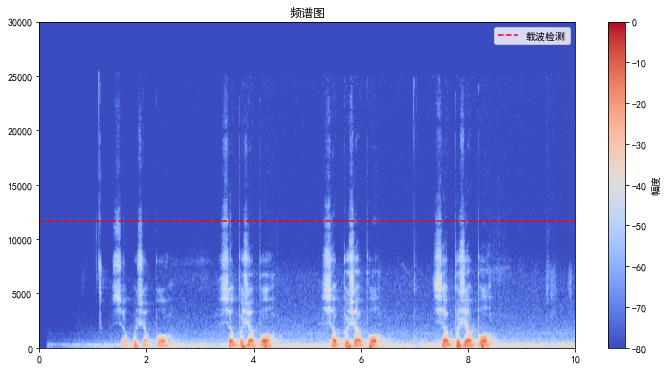

In [6]:
def detect_carrier_trace(audio, sr=48000, n_fft=512, hop_length=128, threshold=0.7, epsilon=1e-3):
    # 1. STFT变换
    S = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length, window=signal.windows.blackman(n_fft))
    mag = np.abs(S)
    F, T = mag.shape
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    
    # 2. 标准化（处理零标准差）
    mag_norm = np.zeros_like(mag)
    for f in range(F):
        x = mag[f, :]
        mu = np.mean(x)
        sigma = np.std(x)
        if sigma < 1e-6:
            mag_norm[f, :] = x
        else:
            mag_norm[f, :] = (x - mu) / sigma
    
    # 3. 余弦相似度计算
    template = np.ones(T)
    numerator = np.sum(mag_norm * template, axis=1)  # 分子
    denominator = np.sqrt(np.sum(mag_norm**2, axis=1)) * np.sqrt(T)  # 分母
    sim = numerator / (denominator + 1e-10)  # 避免除以零
    
    # 4. 筛选最大相似度
    max_idx = np.argmax(sim)
    max_sim = sim[max_idx]
    carrier_freq = freqs[max_idx]
    
    # 5. 斜率验证
    time_series = mag[max_idx, :]
    slope = np.polyfit(np.arange(T), time_series, 1)
    
    if abs(slope) < epsilon and max_sim > threshold:
        return True, carrier_freq
    else:
        return False, 0.0
    

if __name__ == "__main__":
    # 生成一个带有载波的示例音频
    test_file = [f'./test{i}.mp3' for i in range(3)]
    normal_file = [f'./normal{i}.mp3' for i in range(3)]
    audio_paths = test_file+normal_file 
    # audio_paths = test_file
    for audio_path in audio_paths:
        
        y, sr = librosa.load(audio_path, sr=None) 
        detected, freq = fast_carrier_trace_detection(y,sr)
        print(detected)
        print(f"载波检测结果: {detected}, 载波频率: {freq} Hz")

        # 绘图
        plt.figure(figsize=(12, 6))
        D = librosa.stft(y, n_fft=512, hop_length=128, win_length=512)

        D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)


        plt.imshow(D_db, aspect='auto', origin='lower', cmap='coolwarm', extent=[0, 10, 0, 30e3])
        # plt.set_xlabel('Time (s)',fontsize=15)  
        # plt.set_ylabel("Frequency(kHz)",fontsize=15)
        # plt.set_yticks([i*1000 for i in [0,5,10,15,20,25,30]], ["0", "5", "10", "15", "20","25","30"])  

        # plt.pcolormesh(t, f, np.abs(S), shading='auto', cmap='viridis')
        plt.colorbar(label='幅度')
        plt.title('频谱图')
        # plt.xlabel('时间 (s)')
        # plt.ylabel('频率 (Hz)')
        if freq:
            plt.axhline(y=freq, color='r', linestyle='--', label='载波检测')
        plt.legend()
        plt.show()
        # break

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[ 0.01481318  0.00831698 -0.00183176 ... -0.53680757 -0.53241919
 -0.52898328]
0.18779221782574537
True
载波检测结果: True, 载波频率: 2835.9375 Hz


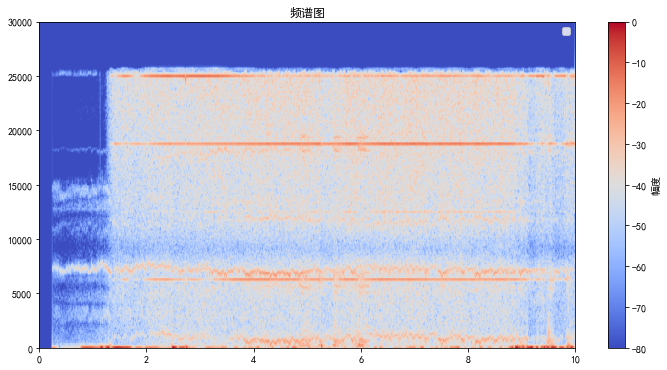

In [ ]:
def detect_carrier_trace(audio, sr=48000, n_fft=512, hop_length=128, 
                        threshold=0.85, epsilon=1e-3, min_duration=0.5):
    # 1. STFT增强参数
    S = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length, 
                    window=signal.windows.blackman(n_fft), center=False)
    mag = np.abs(S)
    F, T = mag.shape
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    time_per_frame = hop_length / sr  # 每帧时间长度
    
    # 2. 能量归一化改进（分频段归一化）
    mag_norm = np.zeros_like(mag)
    freq_bands = [  # 划分频段减少低频干扰
        (0, 500), (500, 4000), (4000, 20000)
    ]
    for band in freq_bands:
        f_low = int(band * n_fft / sr)
        f_high = int(band * n_fft / sr)
        band_data = mag[f_low:f_high, :]
        band_max = np.max(band_data)
        if band_max > 1e-6:
            mag_norm[f_low:f_high, :] = band_data / band_max
    
    # 3. 滑动平均增强稳定性
    win_size = max(3, int(0.1 * T))  # 10%窗口的滑动平均
    mag_smooth = np.apply_along_axis(
        lambda x: np.convolve(x, np.ones(win_size)/win_size, mode='same'),
        axis=1, arr=mag_norm
    )
    
    # 4. 改进模板匹配（动态能量阈值）
    template = np.ones(T)
    energy_ratio = np.sum(mag_smooth, axis=0) / (np.sum(mag_smooth) + 1e-10)
    dynamic_threshold = threshold * (1 + 0.5 * np.std(energy_ratio))
    
    # 5. 鲁棒相似度计算
    numerator = np.dot(mag_smooth, template)
    denominator = np.sqrt(np.sum(mag_smooth**2, axis=1)) * np.sqrt(T)
    sim = numerator / (denominator + 1e-10)
    
    # 6. 连续性检测（载波需持续至少min_duration秒）
    valid_frames = int(min_duration / time_per_frame)
    candidate_mask = (sim > dynamic_threshold)
    candidate_groups = np.split(candidate_mask, np.where(np.diff(candidate_mask))+1)
    valid_candidates = [
        g for g in candidate_groups 
        if np.all(g) and len(g) >= valid_frames
    ]
    
    if not valid_candidates:
        return False, 0.0
    
    # 7. 加权斜率验证（排除瞬态干扰）
    max_idx = np.argmax(sim)
    time_series = mag_smooth[max_idx, :]
    weights = np.linspace(0.5, 1.5, T)  # 加强后半段权重
    slope = np.polyfit(np.arange(T), time_series, 1, w=weights)
    
    if abs(slope) < epsilon:
        return True, freqs[max_idx]
    return False, freqs[max_idx]

if __name__ == "__main__":
    # 生成一个带有载波的示例音频
    test_file = [f'./test{i}.mp3' for i in range(3)]
    normal_file = [f'./normal{i}.mp3' for i in range(3)]
    audio_paths = test_file+normal_file 
    # audio_paths = test_file
    for audio_path in audio_paths:
        
        y, sr = librosa.load(audio_path, sr=None) 
        detected, freq = fast_carrier_trace_detection(y,sr)
        print(detected)
        print(f"载波检测结果: {detected}, 载波频率: {freq} Hz")

        # 绘图
        plt.figure(figsize=(12, 6))
        D = librosa.stft(y, n_fft=512, hop_length=128, win_length=512)

        D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)


        plt.imshow(D_db, aspect='auto', origin='lower', cmap='coolwarm', extent=[0, 10, 0, 30e3])
        # plt.set_xlabel('Time (s)',fontsize=15)  
        # plt.set_ylabel("Frequency(kHz)",fontsize=15)
        # plt.set_yticks([i*1000 for i in [0,5,10,15,20,25,30]], ["0", "5", "10", "15", "20","25","30"])  

        # plt.pcolormesh(t, f, np.abs(S), shading='auto', cmap='viridis')
        plt.colorbar(label='幅度')
        plt.title('频谱图')
        # plt.xlabel('时间 (s)')
        # plt.ylabel('频率 (Hz)')
        if freq:
            plt.axhline(y=freq, color='r', linestyle='--', label='载波检测')
        plt.legend()
        plt.show()
        break